In [1]:
# import the pandas package for data manipulation
import pandas as pd
# import the numpy package for statistics calculation
import numpy as np
# import the pyplot package in the matplotlib library for data visualization
import matplotlib.pyplot as plt
# import the seaborn package to provide alternative data visualization tools
import seaborn as sns
# allow the notebook to render graphics inline
%matplotlib inline
plt.style.use('fivethirtyeight')
from scipy.stats import norm
from scipy import stats
from numpy import log as ln

In [2]:
#display the complete output in jupyter notebook
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/samsontai/Data/main/HousingPrice.csv')
df.set_index('Id', inplace=True)
dt= df
dt.head(710)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900


In [4]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [5]:
# number of variables by datatypes
print(dt.dtypes.astype(str).value_counts())

object     43
int64      34
float64     3
dtype: int64


In [6]:
dt['SalePrice'].isnull().sum()

0

In [7]:
dt['SalePrice'].describe() 

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


skew of SalePrice:  1.8828757597682129
Kurtosis of SalePrice:  6.536281860064529


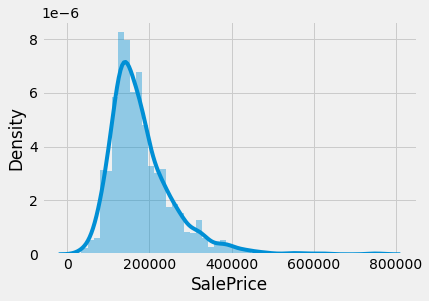

In [8]:
sns.distplot(dt['SalePrice'])
print("skew of SalePrice: ",dt['SalePrice'].skew())
print("Kurtosis of SalePrice: ",dt['SalePrice'].kurt())


 mu = 180921.20 and sigma = 79415.29



/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


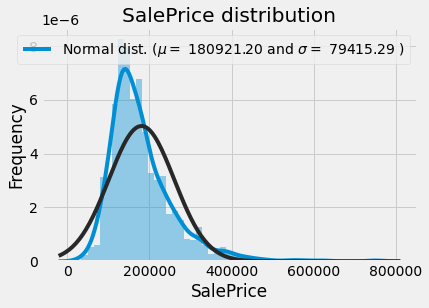

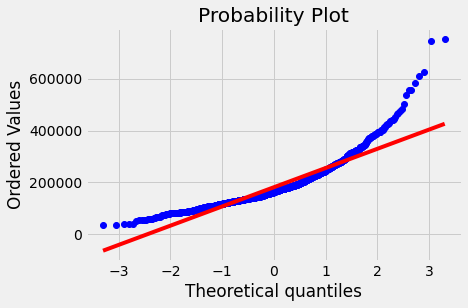

In [9]:
sns.distplot(dt['SalePrice'] , fit=norm);

(mu, sigma) = norm.fit(dt['SalePrice'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

# Distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Probability Plot: assessing whether or not a data set follows a given distribution such as the normal
fig = plt.figure()
res = stats.probplot(dt['SalePrice'], plot=plt)
plt.show()


 mu = 12.02 and sigma = 0.40



/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


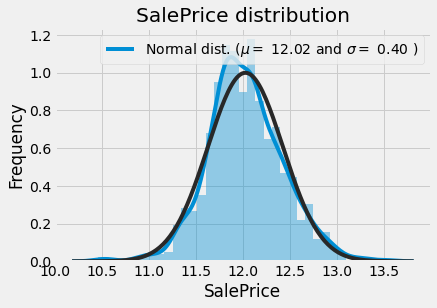

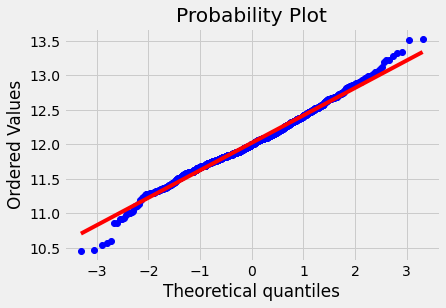

In [10]:
# The transformation of the normal distribution of the sample
# logarithm transformationlog ln(x)
dt["SalePrice"] = ln(dt["SalePrice"])

# distribution
sns.distplot(dt['SalePrice'] , fit=norm);


(mu, sigma) = norm.fit(dt['SalePrice'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

# plot new distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

# Probability Plot
fig = plt.figure()
res = stats.probplot(dt['SalePrice'], plot=plt)
plt.show()

In [11]:
# show the names of the columns with missing values
dt.isnull().sum().sort_values(ascending=False)

PoolQC           1453
MiscFeature      1406
Alley            1369
Fence            1179
FireplaceQu       690
LotFrontage       259
GarageYrBlt        81
GarageCond         81
GarageType         81
GarageFinish       81
GarageQual         81
BsmtExposure       38
BsmtFinType2       38
BsmtCond           37
BsmtQual           37
BsmtFinType1       37
MasVnrArea          8
MasVnrType          8
Electrical          1
MSSubClass          0
Fireplaces          0
Functional          0
KitchenQual         0
KitchenAbvGr        0
BedroomAbvGr        0
HalfBath            0
FullBath            0
BsmtHalfBath        0
TotRmsAbvGrd        0
GarageCars          0
GrLivArea           0
GarageArea          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
BsmtFullBath        0
CentralAir

In [12]:
# show the names of the columns with missing values
dt.isna().any()[lambda x: x]

LotFrontage     True
Alley           True
MasVnrType      True
MasVnrArea      True
BsmtQual        True
BsmtCond        True
BsmtExposure    True
BsmtFinType1    True
BsmtFinType2    True
Electrical      True
FireplaceQu     True
GarageType      True
GarageYrBlt     True
GarageFinish    True
GarageQual      True
GarageCond      True
PoolQC          True
Fence           True
MiscFeature     True
dtype: bool

In [13]:
# total number of columns with missing values before 
print('Total number of varaibles with missing values: ',dt.isnull().any().sum())

# Finding all the columns with missing values in it and put them in a list
null_list=dt.columns[dt.isnull().any()].tolist()
null_list

Total number of varaibles with missing values:  19


['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [14]:
# 缺失值得来处理了
# finding all the categorical variables that have missing values from the list
# Find the number of missing values per column
cat_null_list=[]
for c in null_list:
  if dt[c].dtype == 'object':
    print(c,dt[c].isnull().sum())
    cat_null_list.append(c)
print('Total number of categorial variables with missing values: ',len(cat_null_list))



Alley 1369
MasVnrType 8
BsmtQual 37
BsmtCond 37
BsmtExposure 38
BsmtFinType1 37
BsmtFinType2 38
Electrical 1
FireplaceQu 690
GarageType 81
GarageFinish 81
GarageQual 81
GarageCond 81
PoolQC 1453
Fence 1179
MiscFeature 1406
Total number of categorial variables with missing values:  16


(4, 4)


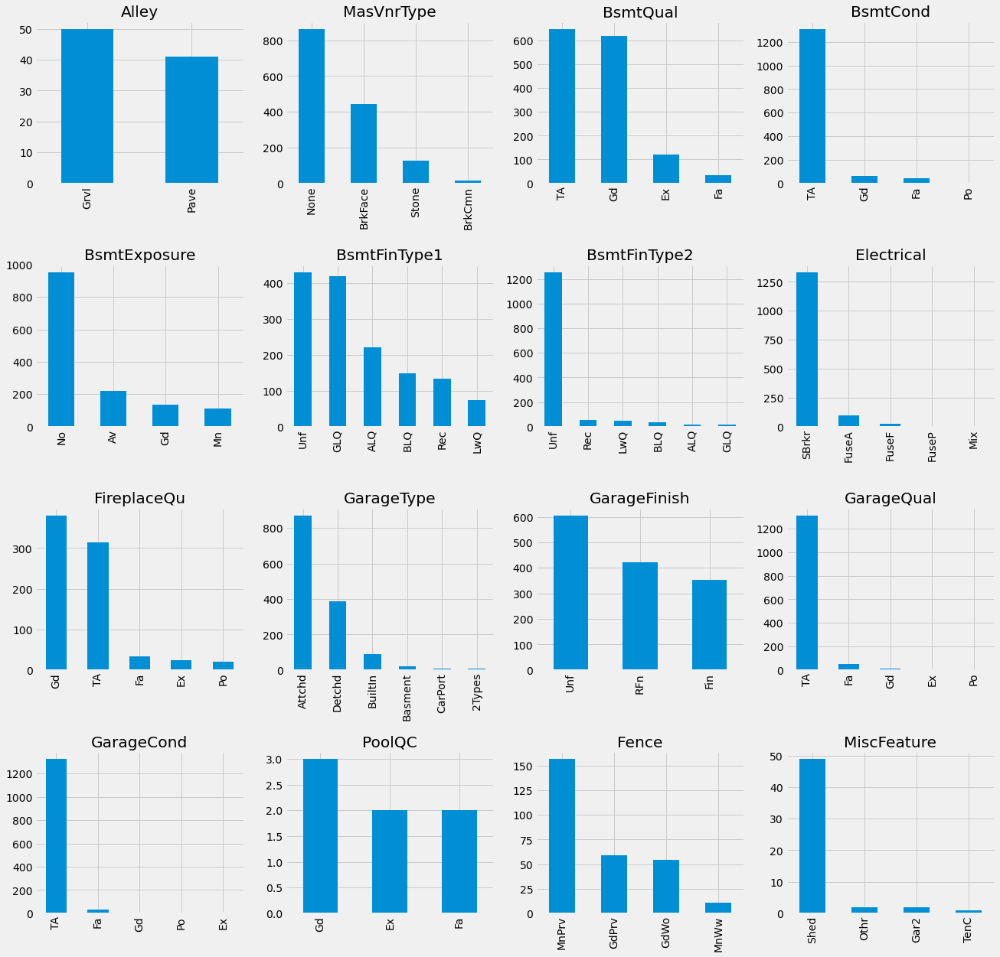

In [15]:
# display all the cateogrical variables with missing values
fig, axs = plt.subplots(4, 4, figsize=(20,20))
plt.subplots_adjust(hspace=0.5)
print(axs.shape)
ax = axs.ravel()

for i, c in enumerate(dt[cat_null_list]):
  dt[c].value_counts().plot(kind="bar",ax=ax[i]).set_title(c)
plt.show()

In [16]:
for col in cat_null_list:
    dt[col] = dt[col].fillna('None')

In [17]:
for c in null_list:
  if dt[c].dtype == 'object':
    print(c,dt[c].isnull().sum())

Alley 0
MasVnrType 0
BsmtQual 0
BsmtCond 0
BsmtExposure 0
BsmtFinType1 0
BsmtFinType2 0
Electrical 0
FireplaceQu 0
GarageType 0
GarageFinish 0
GarageQual 0
GarageCond 0
PoolQC 0
Fence 0
MiscFeature 0


(4, 4)


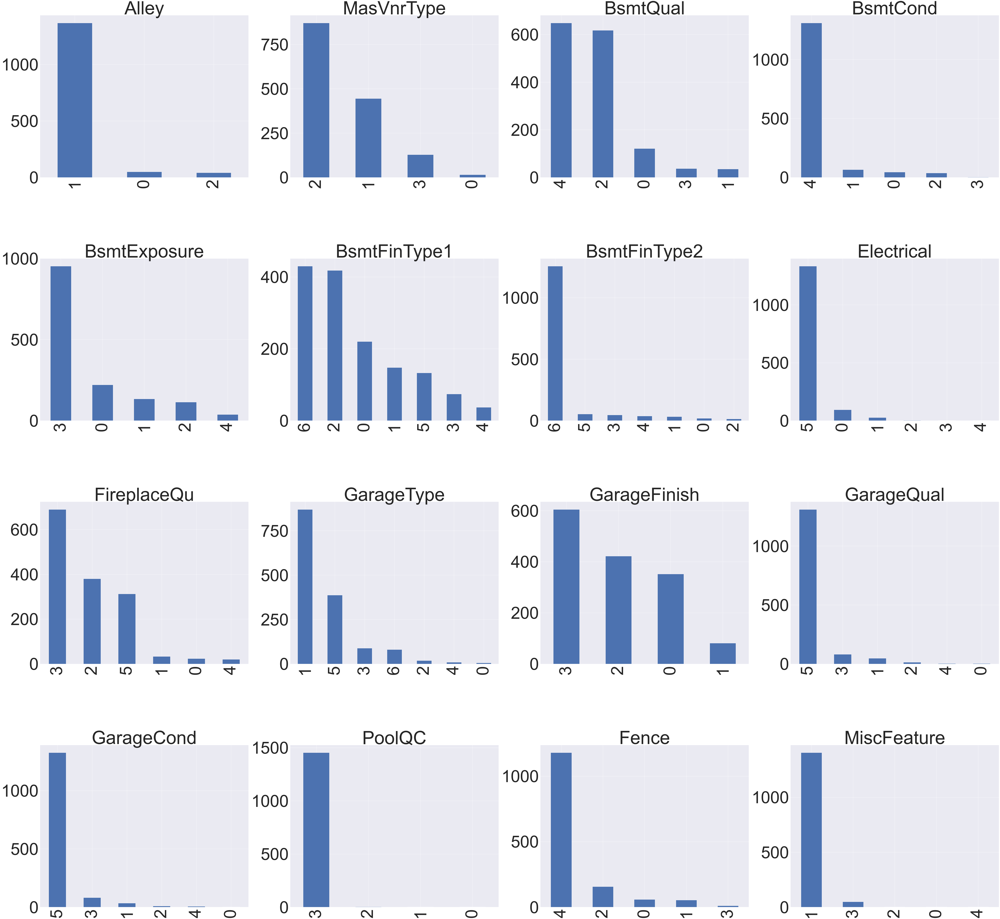

In [62]:
# display all the cateogrical variables with missing values
fig, axs = plt.subplots(4, 4, figsize=(100,100))
plt.subplots_adjust(hspace=0.5)
print(axs.shape)
ax = axs.ravel()

for i, c in enumerate(dt[cat_null_list]):
  dt[c].value_counts().plot(kind="bar",ax=ax[i]).set_title(c)
plt.show()

In [18]:
# finding all the numeric variables that have missing values
# Find the number of missing values per column
num_null_list=[]
for c in null_list:
  if dt[c].dtype == 'float64':
    print(c,dt[c].isnull().sum())
    num_null_list.append(c)
print('Total number of continuous variables with missing values: ',len(num_null_list))

LotFrontage 259
MasVnrArea 8
GarageYrBlt 81
Total number of continuous variables with missing values:  3


In [19]:
dt.loc[dt.loc[:,'LotFrontage'].isnull(),'LotFrontage']=dt.loc[:,'LotFrontage'].median() 
# Continuous values are generally considered to be filled with the median to avoid the effect of extreme data
    
for col in ('MasVnrArea','GarageYrBlt'):
    dt[col]=dt[col].fillna(0)

dt.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,12.247694
2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,12.109011
3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,12.317167
4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,11.849398
5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,12.429216
6,50,RL,85.0,14115,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,None,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,None,MnPrv,Shed,700,10,2009,WD,Normal,11.870600
7,20,RL,75.0,10084,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,None,None,None,0,8,2007,WD,Normal,12.634603
8,60,RL,69.0,10382,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,None,None,Shed,350,11,2009,WD,Normal,12.206073
9,50,RM,51.0,6120,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,None,None,None,0,4,2008,WD,Abnorml,11.774520


In [20]:
# check if we still have null values column
null_list=dt.columns[dt.isnull().any()].tolist()
num_null_list=[]
for c in null_list:
    if dt[c].dtype == 'float64':
        num_null_list.append(c)

print('Total number of continuous variables with missing values after imputation: ',len(num_null_list))
dt.head(10)

Total number of continuous variables with missing values after imputation:  0


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,12.247694
2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,12.109011
3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,12.317167
4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,11.849398
5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,12.429216
6,50,RL,85.0,14115,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,None,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,None,MnPrv,Shed,700,10,2009,WD,Normal,11.870600
7,20,RL,75.0,10084,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,None,None,None,0,8,2007,WD,Normal,12.634603
8,60,RL,69.0,10382,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,None,None,Shed,350,11,2009,WD,Normal,12.206073
9,50,RM,51.0,6120,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,None,None,None,0,4,2008,WD,Abnorml,11.774520


In [21]:
dt.isna().any()

MSSubClass       False
MSZoning         False
LotFrontage      False
LotArea          False
Street           False
Alley            False
LotShape         False
LandContour      False
Utilities        False
LotConfig        False
LandSlope        False
Neighborhood     False
Condition1       False
Condition2       False
BldgType         False
HouseStyle       False
OverallQual      False
OverallCond      False
YearBuilt        False
YearRemodAdd     False
RoofStyle        False
RoofMatl         False
Exterior1st      False
Exterior2nd      False
MasVnrType       False
MasVnrArea       False
ExterQual        False
ExterCond        False
Foundation       False
BsmtQual         False
BsmtCond         False
BsmtExposure     False
BsmtFinType1     False
BsmtFinSF1       False
BsmtFinType2     False
BsmtFinSF2       False
BsmtUnfSF        False
TotalBsmtSF      False
Heating          False
HeatingQC        False
CentralAir       False
Electrical       False
1stFlrSF         False
2ndFlrSF   

In [22]:
# add some features
# total area (basement + 1st floor + 2nd floor)
dt['TotalSF']=dt['TotalBsmtSF'] + dt['1stFlrSF'] + dt['2ndFlrSF']
# House Quality
dt['Total_House_Quality'] = dt['OverallQual'].astype(int) + dt['OverallCond'].astype(int)

In [23]:
dt.dtypes

MSSubClass               int64
MSZoning                object
LotFrontage            float64
LotArea                  int64
Street                  object
Alley                   object
LotShape                object
LandContour             object
Utilities               object
LotConfig               object
LandSlope               object
Neighborhood            object
Condition1              object
Condition2              object
BldgType                object
HouseStyle              object
OverallQual              int64
OverallCond              int64
YearBuilt                int64
YearRemodAdd             int64
RoofStyle               object
RoofMatl                object
Exterior1st             object
Exterior2nd             object
MasVnrType              object
MasVnrArea             float64
ExterQual               object
ExterCond               object
Foundation              object
BsmtQual                object
BsmtCond                object
BsmtExposure            object
BsmtFinT

In [1]:
#numeric columns
number_cols = dt.select_dtypes('number').columns.tolist()
discrete_number = ['MSSubClass','OverallQual','OverallCond']
cont_number=[]
for col in number_cols:
    if col in discrete_number:
        continue
    else:
        cont_number.append(col)
#categorical columns
cat_cols = dt.select_dtypes('object').columns.tolist()

NameError: name 'dt' is not defined

In [25]:
len(cat_cols)

43

<ipython-input-26-c08d36e80844>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


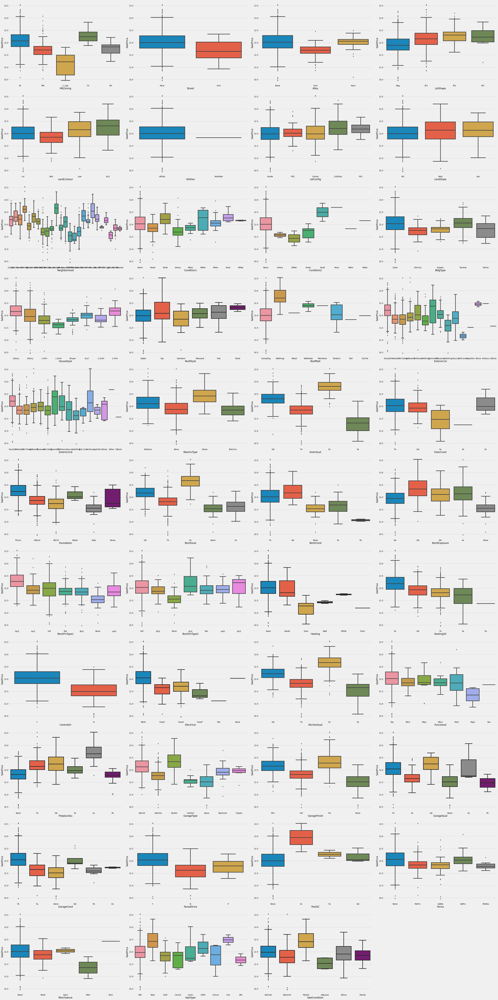

In [26]:
# Use bar plots to plot categorical features against SalePrice.
fig = plt.figure(figsize=(50,100))
for i, c in enumerate(cat_cols):
    fig.add_subplot(11,4,1+i)
    sns.boxplot(x=c,y='SalePrice',data=dt)
    
fig.tight_layout()
fig.show()

fig.savefig('categorical_bar.png')

In [27]:
from sklearn.preprocessing import LabelEncoder
from scipy import stats

In [28]:
# Lable Encoding
for col in cat_cols:
    lbl = LabelEncoder() 
    lbl.fit(list(dt[col].values)) 
    dt[col] = lbl.transform(list(dt[col].values))

In [29]:
# convert to categorical
for col in discrete_number:
    dt[col] = dt[col].astype(str)
for col in cat_cols:
    dt[col] = dt[col].astype(str)

In [30]:
#numeric columns
number_cols = dt.select_dtypes('number').columns.tolist()
#categorical columns
cat_cols = dt.select_dtypes('object').columns.tolist()

In [31]:
print("There are {} numerical columns" . format(len(number_cols)))
print("There are {} categorical columns" . format(len(cat_cols)))

There are 36 numerical columns
There are 46 categorical columns


<ipython-input-32-1e1a9b852809>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


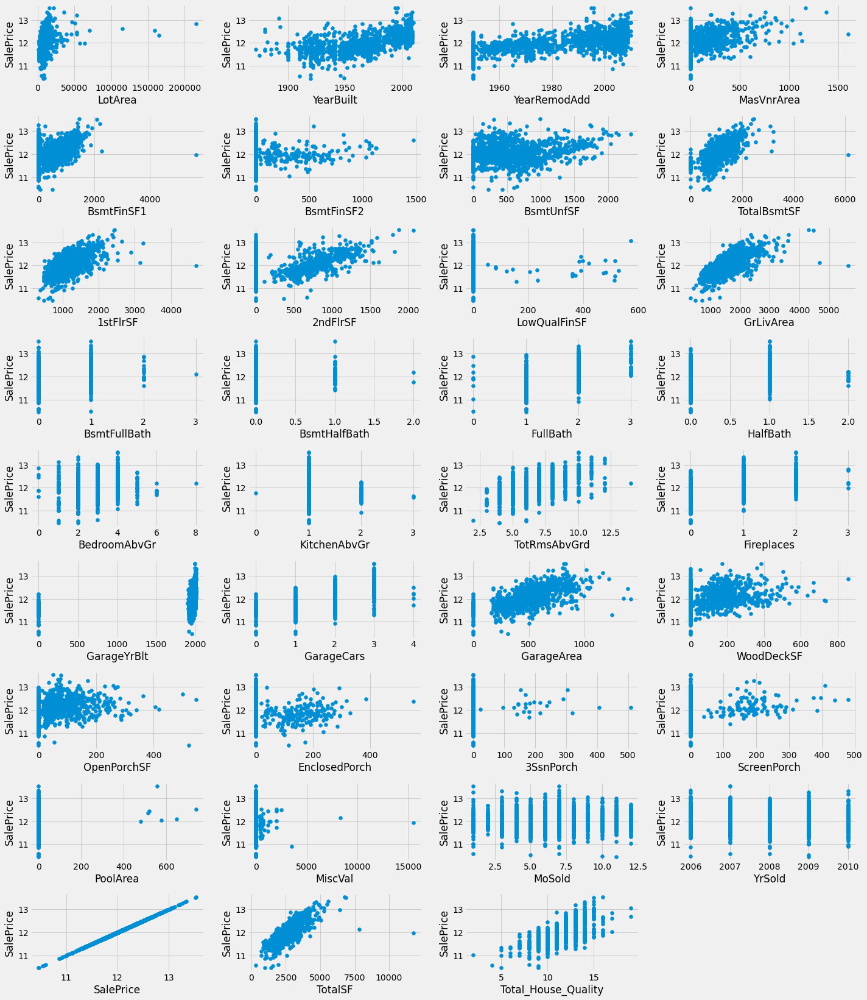

In [32]:
fig = plt.figure(figsize=(20,25))
for i, c in enumerate(number_cols[1:]):
    fig.add_subplot(10,4,1+i)
    plt.scatter(dt[c], dt['SalePrice'])
    plt.xlabel(c)
    plt.ylabel('SalePrice')
fig.tight_layout()
fig.show()

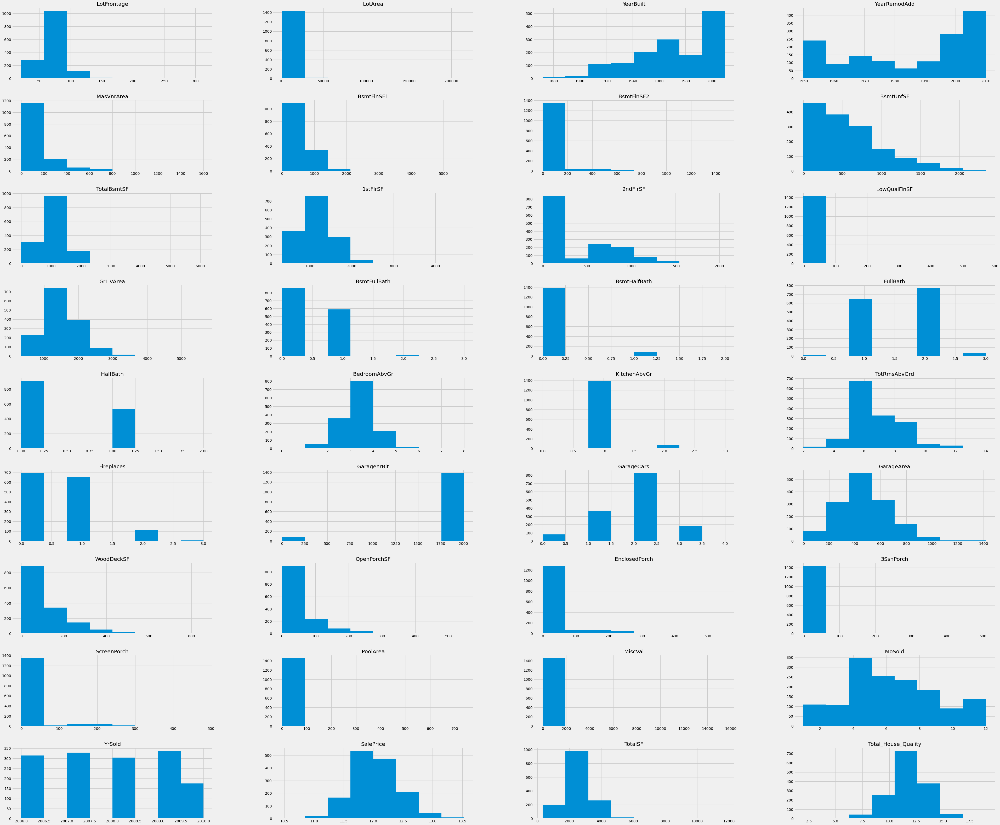

In [33]:
# Detecting Outliers
dt[number_cols].hist(bins=8, figsize=(60, 120), layout=(20, 4));
plt.show()

In [34]:
from scipy.stats import norm, skew

# Check the skew of all numerical features
skew_cols = dt[number_cols].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)

skewness = pd.DataFrame({'Skew' :skew_cols})
skewness

,Skew
MiscVal,24.451640
PoolArea,14.813135
LotArea,12.195142
3SsnPorch,10.293752
LowQualFinSF,9.002080
KitchenAbvGr,4.483784
BsmtFinSF2,4.250888
ScreenPorch,4.117977
BsmtHalfBath,4.099186
EnclosedPorch,3.086696


In [35]:
# capping all the outliers to min or max values  
for x in number_cols:
    Q1 = dt[x].quantile(0.25)
    Q3 = dt[x].quantile(0.75)
    IQR = Q3 - Q1
    
    max = Q3+(1.5*IQR)
    min = Q1-(1.5*IQR)
    dt[(dt[x] < min) | (dt[x] > max)]
    dt[x]=np.where(dt[x]>max,max,np.where(dt[x]<min,min,dt[x]))

In [36]:
# Check the skew of all numerical features
skew_cols = dt[number_cols].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)

skewness = pd.DataFrame({'Skew' :skew_cols})
skewness

,Skew
MasVnrArea,1.286436
OpenPorchSF,1.135133
WoodDeckSF,1.082559
2ndFlrSF,0.799287
BsmtUnfSF,0.796112
BsmtFinSF1,0.739116
HalfBath,0.675203
1stFlrSF,0.663451
GrLivArea,0.592946
Fireplaces,0.584054


<ipython-input-37-4b7871f027fc>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


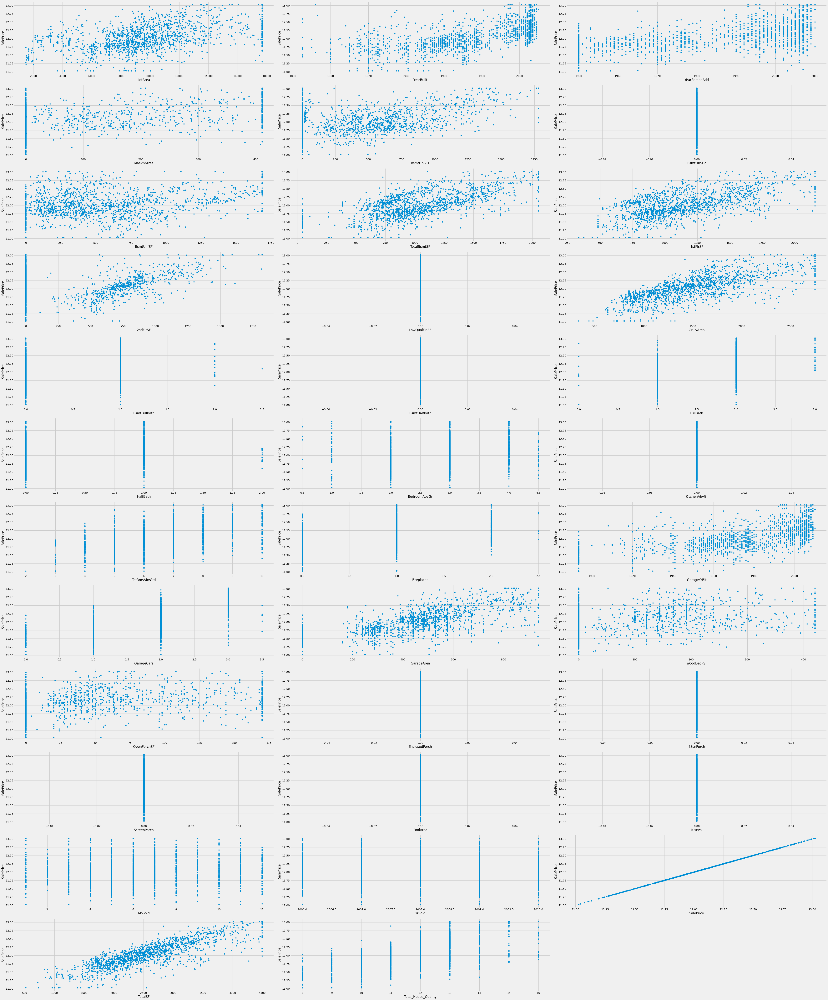

In [37]:
fig = plt.figure(figsize=(60,120))
for i, c in enumerate(number_cols[1:]):
    fig.add_subplot(20,3,1+i)
    plt.scatter(dt[c], dt['SalePrice'])
    plt.xlabel(c)
    plt.ylabel('SalePrice')
fig.tight_layout()
fig.show()

<ipython-input-38-cb046ec77ae8>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


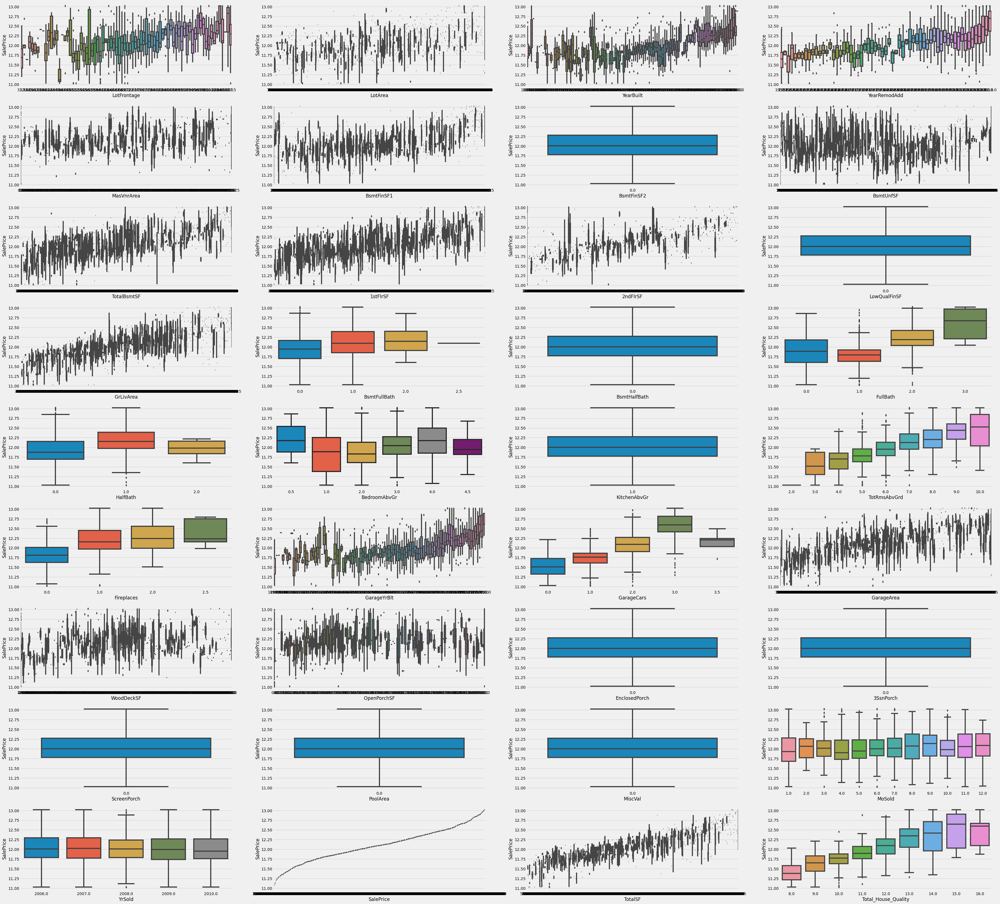

In [38]:
# Use bar plots to plot categorical features against SalePrice.
fig = plt.figure(figsize=(50,100))
for i, c in enumerate(number_cols):
    fig.add_subplot(20,4,1+i)
    sns.boxplot(x=c,y='SalePrice',data=dt)
    
fig.tight_layout()
fig.show()

<AxesSubplot:>

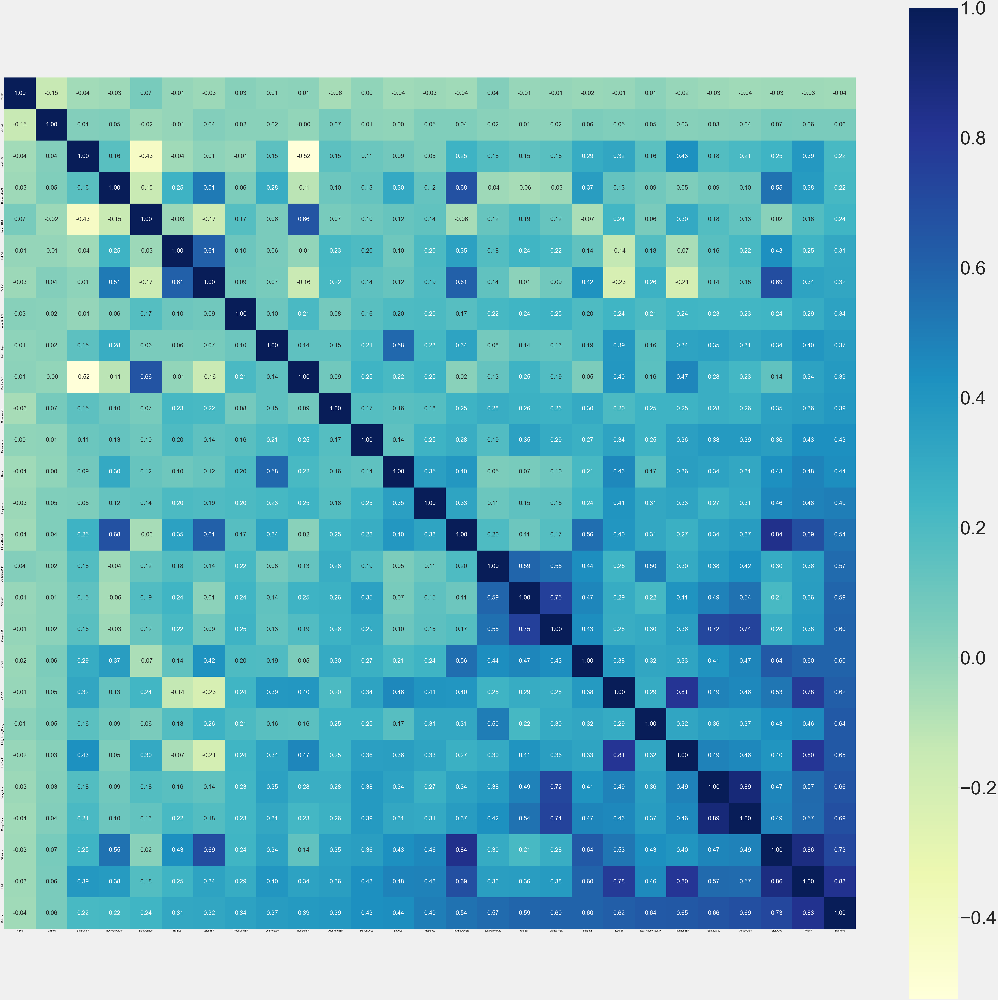

In [39]:
corrmat = dt.corr()["SalePrice"].dropna().sort_values()
f, ax = plt.subplots(figsize=(100, 100))
cols_index = corrmat.index
sns.set(font_scale=10)
cm = np.corrcoef(dt[cols_index].values.T)
sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', 
                 annot_kws={'size': 35}, yticklabels=cols_index, xticklabels=cols_index,cmap='YlGnBu')

In [40]:
corrmat = dt.corr()["SalePrice"].dropna().sort_values()
corrmat

YrSold                -0.037739
MoSold                 0.062790
BsmtUnfSF              0.216129
BedroomAbvGr           0.223546
BsmtFullBath           0.240081
HalfBath               0.314787
2ndFlrSF               0.316346
WoodDeckSF             0.343153
LotFrontage            0.374521
BsmtFinSF1             0.385745
OpenPorchSF            0.391145
MasVnrArea             0.432307
LotArea                0.438971
Fireplaces             0.494139
TotRmsAbvGrd           0.541618
YearRemodAdd           0.570863
YearBuilt              0.594505
GarageYrBlt            0.595119
FullBath               0.596076
1stFlrSF               0.617222
Total_House_Quality    0.639460
TotalBsmtSF            0.646470
GarageArea             0.664164
GarageCars             0.687305
GrLivArea              0.725179
TotalSF                0.825449
SalePrice              1.000000
Name: SalePrice, dtype: float64

In [41]:
corrmat.abs() > 0.2

YrSold                 False
MoSold                 False
BsmtUnfSF               True
BedroomAbvGr            True
BsmtFullBath            True
HalfBath                True
2ndFlrSF                True
WoodDeckSF              True
LotFrontage             True
BsmtFinSF1              True
OpenPorchSF             True
MasVnrArea              True
LotArea                 True
Fireplaces              True
TotRmsAbvGrd            True
YearRemodAdd            True
YearBuilt               True
GarageYrBlt             True
FullBath                True
1stFlrSF                True
Total_House_Quality     True
TotalBsmtSF             True
GarageArea              True
GarageCars              True
GrLivArea               True
TotalSF                 True
SalePrice               True
Name: SalePrice, dtype: bool

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score, ShuffleSplit
from sklearn.feature_selection import RFECV

In [43]:
select_dt = dt
select_dt.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalSF,Total_House_Quality
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,3,65.0,8450.0,1,1,3,3,0,4,0,5,2,2,0,5,7,5,2003.0,2003.0,1,1,12,13,1,196.0,2,4,2,2,4,3,2,706.0,6,0.0,150.0,856.0,1,0,1,5,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,2,8.0,6,0.0,3,1,2003.0,2,2.0,548.0,5,5,2,0.0,61.0,0.0,0.0,0.0,0.0,3,4,1,0.0,2.0,2008.0,8,4,12.247694,2566.0,12.0
2,20,3,80.0,9600.0,1,1,3,3,0,2,0,24,1,2,0,2,6,8,1976.0,1976.0,1,1,8,8,2,0.0,3,4,1,2,4,1,0,978.0,6,0.0,284.0,1262.0,1,0,1,5,1262.0,0.0,0.0,1262.0,0.0,0.0,2.0,0.0,3.0,1.0,3,6.0,6,1.0,5,1,1976.0,2,2.0,460.0,5,5,2,298.0,0.0,0.0,0.0,0.0,0.0,3,4,1,0.0,5.0,2007.0,8,4,12.109011,2524.0,14.0
3,60,3,68.0,11250.0,1,1,0,3,0,4,0,5,2,2,0,5,7,5,2001.0,2002.0,1,1,12,13,1,162.0,2,4,2,2,4,2,2,486.0,6,0.0,434.0,920.0,1,0,1,5,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,2,6.0,6,1.0,5,1,2001.0,2,2.0,608.0,5,5,2,0.0,42.0,0.0,0.0,0.0,0.0,3,4,1,0.0,9.0,2008.0,8,4,12.317167,2706.0,12.0
4,70,3,60.0,9550.0,1,1,0,3,0,0,0,6,2,2,0,5,7,5,1915.0,1970.0,1,1,13,15,2,0.0,3,4,0,4,1,3,0,216.0,6,0.0,540.0,756.0,1,2,1,5,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,2,7.0,6,1.0,2,5,1998.0,3,3.0,642.0,5,5,2,0.0,35.0,0.0,0.0,0.0,0.0,3,4,1,0.0,2.0,2006.0,8,0,11.849398,2473.0,12.0
5,60,3,84.0,14260.0,1,1,0,3,0,2,0,15,2,2,0,5,8,5,2000.0,2000.0,1,1,12,13,1,350.0,2,4,2,2,4,0,2,655.0,6,0.0,490.0,1145.0,1,0,1,5,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,2,9.0,6,1.0,5,1,2000.0,2,3.0,836.0,5,5,2,192.0,84.0,0.0,0.0,0.0,0.0,3,4,1,0.0,12.0,2008.0,8,4,12.429216,3343.0,13.0


In [44]:
X = select_dt.drop('SalePrice',axis=1)
y = select_dt['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=12)

In [45]:
rf = RandomForestRegressor(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestRegressor()

In [46]:
sorted_idx = rf.feature_importances_
f_i = list(zip(X_train.columns.values.tolist(),rf.feature_importances_))
f_i.sort(key = lambda x : x[1])
f_i

[('Utilities', 0.0),
 ('BsmtFinSF2', 0.0),
 ('LowQualFinSF', 0.0),
 ('BsmtHalfBath', 0.0),
 ('KitchenAbvGr', 0.0),
 ('EnclosedPorch', 0.0),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 0.0),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('PoolQC', 3.8449938360339174e-06),
 ('Condition2', 2.273072015237515e-05),
 ('Street', 3.774875583441996e-05),
 ('MiscFeature', 0.00014763507995976203),
 ('Heating', 0.00017959388846703757),
 ('RoofMatl', 0.0002966244082547607),
 ('BsmtFinType2', 0.00031517109098012593),
 ('LandSlope', 0.0003707946107837352),
 ('Alley', 0.0004148698494891521),
 ('BsmtCond', 0.0004230300966340719),
 ('Foundation', 0.00042929328819491273),
 ('Electrical', 0.00044125834519643105),
 ('SaleType', 0.0005971634952704463),
 ('Condition1', 0.0006075201061093671),
 ('Fence', 0.0006360197094941856),
 ('MasVnrType', 0.0006560921649156629),
 ('LotConfig', 0.0006611728093020397),
 ('RoofStyle', 0.000675549179982211),
 ('BldgType', 0.0006809342283411547),
 ('LotShape', 0.0007347700408577003),
 ('

In [47]:
fig, ax = plt.subplots(figsize=(100, 200)) 
ax.xaxis.set_tick_params(pad=5) 
ax.yaxis.set_tick_params(pad=20) 
fig.text(0.9, 0.15, 'Jeeteshgavande30', fontsize=5, 
         color='grey', ha='right', va='bottom', 
         alpha=0.7) 
plt.barh([x[0] for x in f_i],[x[1] for x in f_i])

<BarContainer object of 81 artists>

In [48]:
rfe = RFECV(rf,cv=5,scoring="neg_mean_squared_error")

rfe.fit(X_train,y_train)

RFECV(cv=5, estimator=RandomForestRegressor(), scoring='neg_mean_squared_error')

In [49]:
selected_features = np.array(X_train.columns.values.tolist())[rfe.get_support()]
selected_features

array(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea',
       'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF'

In [50]:
len(selected_features)

79

In [51]:
featured_dt = dt[selected_features]
featured_dt

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalSF,Total_House_Quality
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,3,65.0,8450.0,1,1,3,3,0,4,0,5,2,2,0,5,7,5,2003.0,2003.0,1,1,12,13,1,196.000,2,4,2,2,4,3,2,706.000,6,0.0,150.0,856.0,1,0,1,5,856.000,854.0,0.0,1710.000,1.0,2.0,1.0,3.0,1.0,2,8.0,6,0.0,3,1,2003.0,2,2.0,548.00,5,5,2,0.0,61.0,0.0,0.0,0.0,3,4,1,0.0,2.0,2008.0,8,4,2566.00,12.0
2,20,3,80.0,9600.0,1,1,3,3,0,2,0,24,1,2,0,2,6,8,1976.0,1976.0,1,1,8,8,2,0.000,3,4,1,2,4,1,0,978.000,6,0.0,284.0,1262.0,1,0,1,5,1262.000,0.0,0.0,1262.000,0.0,2.0,0.0,3.0,1.0,3,6.0,6,1.0,5,1,1976.0,2,2.0,460.00,5,5,2,298.0,0.0,0.0,0.0,0.0,3,4,1,0.0,5.0,2007.0,8,4,2524.00,14.0
3,60,3,68.0,11250.0,1,1,0,3,0,4,0,5,2,2,0,5,7,5,2001.0,2002.0,1,1,12,13,1,162.000,2,4,2,2,4,2,2,486.000,6,0.0,434.0,920.0,1,0,1,5,920.000,866.0,0.0,1786.000,1.0,2.0,1.0,3.0,1.0,2,6.0,6,1.0,5,1,2001.0,2,2.0,608.00,5,5,2,0.0,42.0,0.0,0.0,0.0,3,4,1,0.0,9.0,2008.0,8,4,2706.00,12.0
4,70,3,60.0,9550.0,1,1,0,3,0,0,0,6,2,2,0,5,7,5,1915.0,1970.0,1,1,13,15,2,0.000,3,4,0,4,1,3,0,216.000,6,0.0,540.0,756.0,1,2,1,5,961.000,756.0,0.0,1717.000,1.0,1.0,0.0,3.0,1.0,2,7.0,6,1.0,2,5,1998.0,3,3.0,642.00,5,5,2,0.0,35.0,0.0,0.0,0.0,3,4,1,0.0,2.0,2006.0,8,0,2473.00,12.0
5,60,3,84.0,14260.0,1,1,0,3,0,2,0,15,2,2,0,5,8,5,2000.0,2000.0,1,1,12,13,1,350.000,2,4,2,2,4,0,2,655.000,6,0.0,490.0,1145.0,1,0,1,5,1145.000,1053.0,0.0,2198.000,1.0,2.0,1.0,4.0,1.0,2,9.0,6,1.0,5,1,2000.0,2,3.0,836.00,5,5,2,192.0,84.0,0.0,0.0,0.0,3,4,1,0.0,12.0,2008.0,8,4,3343.00,13.0
6,50,3,85.0,14115.0,1,1,0,3,0,4,0,11,2,2,0,0,5,5,1993.0,1995.0,1,1,12,13,2,0.000,3,4,5,2,4,3,2,732.000,6,0.0,64.0,796.0,1,0,1,5,796.000,566.0,0.0,1362.000,1.0,1.0,1.0,1.0,1.0,3,5.0,6,0.0,3,1,1993.0,3,2.0,480.00,5,5,2,40.0,30.0,0.0,0.0,0.0,3,2,3,0.0,10.0,2009.0,8,4,2158.00,10.0
7,20,3,75.0,10084.0,1,1,3,3,0,4,0,21,2,2,0,2,8,5,2004.0,2005.0,1,1,12,13,3,186.000,2,4,2,0,4,0,2,1369.000,6,0.0,317.0,1686.0,1,0,1,5,1694.000,0.0,0.0,1694.000,1.0,2.0,0.0,3.0,1.0,2,7.0,6,1.0,2,1,2004.0,2,2.0,636.00,5,5,2,255.0,57.0,0.0,0.0,0.0,3,4,1,0.0,8.0,2007.0,8,4,3380.00,13.0
8,60,3,69.0,10382.0,1,1,0,3,0,0,0,14,4,2,0,5,7,6,1973.0,1973.0,1,1,6,6,3,240.000,3,4,1,2,4,2,0,859.000,1,0.0,216.0,1107.0,1,0,1,5,1107.000,983.0,0.0,2090.000,1.0,2.0,1.0,3.0,1.0,3,7.0,6,2.0,5,1,1973.0,2,2.0,484.00,5,5,2,235.0,170.0,0.0,0.0,0.0,3,4,3,0.0,11.0,2009.0,8,4,3197.00,13.0
9,50,4,51.0,6120.0,1,1,3,3,0,4,0,17,0,2,0,0,7,5,1931.0,1950.0,1,1,3,15,2,0.000,3,4,0,4,4,3,6,0.000,6,0.0,952.0,952.0,1,2,1,1,1022.000,752.0,0.0,1774.000,0.0,2.0,0.0,2.0,1.0,3,8.0,2,2.0,5,5,1931.0,3,2.0,468.00,1,5,2,90.0,0.0,0.0,0.0,0.0,3,4,1,0.0,4.0,2008.0,8,0,2726.00,12.0


In [52]:
X = featured_dt
y = dt['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
print(X_test.shape,X.shape)

(365, 79) (1460, 79)


In [53]:
from sklearn.model_selection import cross_val_score, GridSearchCV, KFold
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.linear_model import ElasticNet, SGDRegressor, BayesianRidge
from sklearn.kernel_ridge import KernelRidge
from sklearn.tree import DecisionTreeRegressor

In [54]:
model = DecisionTreeRegressor()
model1 = model.fit(X_train,y_train)
predict = np.exp(model1.predict(X_test))
result=pd.DataFrame({'SalePrice_Obversition':np.exp(y_test), 'SalePrice_predict':predict})
result

,SalePrice_Obversition,SalePrice_predict
Id,,
1321,156500.000000,163000.000000
560,234000.000000,192500.000000
139,230000.000000,193000.000000
764,337000.000000,253293.000000
1157,179900.000000,153500.000000
792,146800.000000,152000.000000
464,188700.000000,144000.000000
146,130000.000000,193000.000000
1235,130000.000000,137000.000000


In [55]:
def rmse_cv(model,X,y):#输入模型，X，Y，输出RMSE
    rmse = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=5))
    return rmse

In [69]:
models = [LinearRegression(),
          Ridge(),
          Lasso(alpha=0.01,max_iter=10000),
          RandomForestRegressor(),
          GradientBoostingRegressor(),
          SVR(),
          LinearSVR(),
          ElasticNet(alpha=0.001,max_iter=10000),
          BayesianRidge(),
          KernelRidge(alpha=1, kernel='linear', degree=2, coef0=1)]
names = ["LR", "Ridge", "Lasso", "RF", "GBR", "SVR", "LinSVR", "Ela","Bay","Ker"]
models_resm = []
for name, model in zip(names, models):
    score = rmse_cv(model, X_train, y_train)
    models_resm.append((name,score.mean()))
    print("{}: score mean: {:.6f}, score standard deviation: {:.4f}".format(name,score.mean(),score.std()))

LR: score mean: 0.132593, score standard deviation: 0.0249
Ridge: score mean: 0.130376, score standard deviation: 0.0213
Lasso: score mean: 0.132046, score standard deviation: 0.0193
RF: score mean: 0.137167, score standard deviation: 0.0168
GBR: score mean: 0.130324, score standard deviation: 0.0183
SVR: score mean: 0.194290, score standard deviation: 0.0133


/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/jimmyng/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWa

LinSVR: score mean: 0.268244, score standard deviation: 0.0880
Ela: score mean: 0.128595, score standard deviation: 0.0195
Bay: score mean: 0.128435, score standard deviation: 0.0198
Ker: score mean: 0.130386, score standard deviation: 0.0200


In [70]:
models_resm.sort(key = lambda x : x[1],reverse =True)
models_resm

[('LinSVR', 0.26824446706159794),
 ('SVR', 0.19428960916003477),
 ('RF', 0.1371669783343584),
 ('LR', 0.13259313024383151),
 ('Lasso', 0.13204615444855267),
 ('Ker', 0.1303856574489269),
 ('Ridge', 0.1303758174535284),
 ('GBR', 0.13032392506234997),
 ('Ela', 0.12859541320942186),
 ('Bay', 0.12843473293233676)]

<BarContainer object of 10 artists>

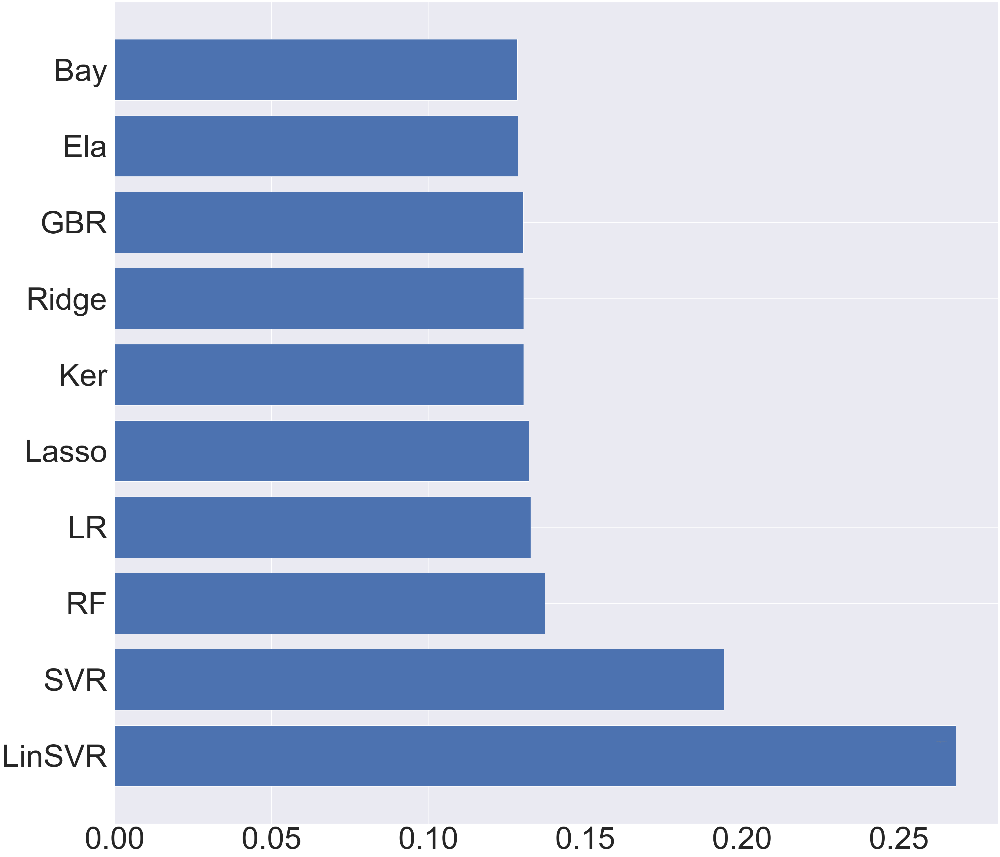

In [71]:
fig, ax = plt.subplots(figsize=(50, 50)) 
ax.xaxis.set_tick_params(pad=5) 
ax.yaxis.set_tick_params(pad=20) 
fig.text(0.9, 0.15, 'Jeeteshgavande30', fontsize=5, 
         color='grey', ha='right', va='bottom', 
         alpha=0.7) 
plt.barh([x[0] for x in models_resm],[x[1] for x in models_resm])